In [1]:
import math
import os
import pandas as pd

import numpy as np

from matplotlib.colors import LogNorm
import time 
import tqdm
import h5py
from matplotlib.colors import BoundaryNorm
from matplotlib.ticker import MaxNLocator
from matplotlib.figure import Figure
import datetime
from datetime import datetime
import matplotlib.patches as mpatches
import matplotlib.gridspec as gridspec
import matplotlib.pyplot as plt

from cutax.cutlist import CutList
from cutax import cut_efficiency
from cutax.cut_efficiency import CutAcceptance
#from cutax.cuts.s1_hitperpmt import *
from matplotlib.colors import LogNorm
import straxen
import cutax

# import plotly.express as px
from scipy.stats import kde
from scipy.ndimage.filters import gaussian_filter
from scipy import interpolate
import xgboost 
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

/tmp/jobs/28033250/ipykernel_1372/3461447912.py:30: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  from scipy.ndimage.filters import gaussian_filter


In [2]:
%matplotlib inline

In [3]:
params = {
    'font.family': 'serif',
    'font.size' : 24, 'axes.titlesize' : 42, 'axes.labelsize' : 32, 'axes.linewidth' : 2,
    # ticks
    'xtick.labelsize' : 24, 'ytick.labelsize' : 24, 'xtick.major.size' : 16, 'xtick.minor.size' : 8,
    'ytick.major.size' : 16, 'ytick.minor.size' : 8, 'xtick.major.width' : 2, 'xtick.minor.width' : 2,
    'ytick.major.width' : 2, 'ytick.minor.width' : 2, 'xtick.direction' : 'in', 'ytick.direction' : 'in',
    # markers
    'lines.markersize' : 8, 'lines.markeredgewidth' : 2, 'errorbar.capsize' : 5, 'lines.linewidth' : 2,
    #'lines.linestyle' : None, 'lines.marker' : None,
    'savefig.bbox' : 'tight', 'legend.fontsize' : 12,
    'axes.labelsize': 24, 'axes.titlesize':24, 'xtick.labelsize':18, 'ytick.labelsize':18,
    'backend': 'Agg', 'mathtext.fontset': 'dejavuserif',
    'figure.facecolor':'w',
    #pad
    'axes.labelpad':12,
    # ticks
    'xtick.major.pad': 6,   'xtick.minor.pad': 6,   
    'ytick.major.pad': 3.5, 'ytick.minor.pad': 3.5,
}
plt.rcParams.update(params)

In [4]:
def cut_S1OneHitPerPMT(events):
        mask = events['s1_n_channels'] == events['s1_n_hits']
        mask |= ~(events['s1_n_hits']<=3)
        events['cut_s1_one_hit_per_pmt'] = mask
        return events

def cut_s1_n_nits(events):
        mask = events['s1_n_hits'] <= 3
        events['cut_cevns_search_s1_n_hits'] = mask
        return events
    
def cut_YBe_FV(df):
    theta_min = -1 * math.pi / 12
    theta_max = 0.4 * math.pi
    mask = df['r'] > 33
    mask &= df['r'] < 63
    mask &= df['y'] > math.tan(theta_min) * df['x']
    mask &= df['y'] < math.tan(theta_max) * df['x']
    mask &= df['z'] > -138.6515
    mask &= df['z'] < -20
    
    df['cut_fv_ybe'] = mask
    return df

def cut_s1_aft_ybe(df):
    mask = df['s1_area_fraction_top'] <=0.8
    mask |= df['s1_tight_coincidence'] >=3
    df['cut_s1_aft_ybe'] = mask
    
    return df

In [5]:
hs='/project2/lgrandi/ghusheng/YBe_BDT_INPUT/'
_YBe = hs+'YBe_ROI.hdf5'
_Y88 = hs+'Y88_ROI.hdf5'
ac_h5 = hs+'ac_ybe_ybe_0607.h5' #no shadow 
_sim =  hs+'YBe_sim_ROI.hdf5'
ac_old = hs+'ac_ybe_0109.h5' #w/ shadow 

In [6]:
df_YBe = pd.read_hdf(_YBe)
df_Y88 = pd.read_hdf(_Y88)
df_sim = pd.read_hdf(_sim)
with h5py.File(ac_h5, 'r', libver='latest', swmr=True) as ipt:
    normalization_2f = ipt['fold2_df'].attrs['normalization']
    

ac_df_2f = pd.read_hdf(ac_h5, key='fold2_df')

with h5py.File(ac_h5, 'r', libver='latest', swmr=True) as ipt:
    normalization_3f = ipt['fold3_df'].attrs['normalization']
    run_time = ipt['fold3_df'].attrs['run_time']
    
ac_df_3f = pd.read_hdf(ac_h5, key='fold3_df')




In [7]:
ac_df_2f = cut_S1OneHitPerPMT(ac_df_2f)
ac_df_2f = cut_s1_n_nits(ac_df_2f)
ac_df_2f = cut_YBe_FV(ac_df_2f)

ac_df_3f = cut_S1OneHitPerPMT(ac_df_3f)
ac_df_3f = cut_s1_n_nits(ac_df_3f)
ac_df_3f = cut_YBe_FV(ac_df_3f)

/tmp/jobs/28033250/ipykernel_1372/2759111153.py:9: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  events['cut_cevns_search_s1_n_hits'] = mask
/tmp/jobs/28033250/ipykernel_1372/2759111153.py:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df['cut_fv_ybe'] = mask
/tmp/jobs/28033250/ipykernel_1372/2759111153.py:9: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To 

In [8]:
df_YBe = cut_s1_aft_ybe(df_YBe)
df_Y88 = cut_s1_aft_ybe(df_Y88)
df_sim = cut_s1_aft_ybe(df_sim)
ac_df_2f = cut_s1_aft_ybe(ac_df_2f)
ac_df_3f = cut_s1_aft_ybe(ac_df_3f)

/tmp/jobs/28033250/ipykernel_1372/2759111153.py:28: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df['cut_s1_aft_ybe'] = mask
/tmp/jobs/28033250/ipykernel_1372/2759111153.py:28: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df['cut_s1_aft_ybe'] = mask


## 3-Fold BDT Training

In [9]:
lt=100
def loose_filter(df):
    mask = ((df['s1_area']<=10)&(df['s1_area']>=0)&(df['s2_area']>=lt)
                &(df['s2_area']<=1000)
                &(df['cut_cs2_area_fraction_top'])
                &(df['cut_s1_one_hit_per_pmt'])
                #&(df['cut_cevns_search_s1_n_hits'])
                #&(df['cut_daq_veto'])
                #&(df['cut_main_is_valid_triggering_peak'])
                &(df['cut_interaction_exists'])
                #&(df['cut_run_boundaries'])
                &(df['cut_s1_area_fraction_top'])
                &(df['cut_s1_max_pmt'])
                &(df['cut_s1_pattern_bottom'])
                &(df['cut_s1_pattern_top'])
                #&(df['cut_s1_single_scatter'])
                #&(df['cut_s1_width'])
                #&(df['cut_s2_pattern'])
                &(df['cut_s2_recon_pos_diff'])
                #&(df['cut_s2_single_scatter'])
                #&(df['cut_s2_width_wire_modeled_wimps'])
                
                #&(df['cut_fiducial_volume'])
                &(df['cut_fv_ybe'])
                &(df['cut_s2_naive_bayes'])
                #&(df['cut_s1_naive_bayes'])
                #&(df['cut_bdt_ac']) 
                # &(df['cut_time_veto'])
                &(df['s1_tight_coincidence']>=3)
                &(df['wire_cut'])
                # &(df['cut_time_shadow'])
                # &(df['cut_position_shadow'])
                # &(df['cut_ambience'])
        )
    df_afc = df.loc[mask]
     
    return df_afc

In [10]:
def loose_filter_ac(df):
    mask = ((df['s1_area']<=10)&(df['s1_area']>=0)&(df['s2_area']>=lt)
                &(df['s2_area']<=1000)
                &(df['cut_cs2_area_fraction_top'])
                &(df['cut_s1_one_hit_per_pmt'])
                #&(df['cut_cevns_search_s1_n_hits'])
                #&(df['cut_daq_veto'])
               # &(df['cut_main_is_valid_triggering_peak'])
                &(df['cut_interaction_exists'])
                #&(df['cut_run_boundaries'])
                &(df['cut_s1_area_fraction_top'])
                &(df['cut_s1_max_pmt'])
                &(df['cut_s1_pattern_bottom'])
                &(df['cut_s1_pattern_top'])
                #&(df['cut_s1_single_scatter'])
                #&(df['cut_s1_width'])
                #&(df['cut_s2_pattern'])
                &(df['cut_s2_recon_pos_diff'])
                #&(df['cut_s2_single_scatter'])
                #&(df['cut_s2_width_wire_modeled_wimps'])
                
                #&(df['cut_fiducial_volume'])
                &(df['cut_fv_ybe'])
                &(df['cut_s2_naive_bayes'])
                #&(df['cut_s1_naive_bayes'])
                #&(df['cut_bdt_ac']) # cut acceptance is very low, need to check
                # &(df['cut_time_veto'])
                &(df['s1_tight_coincidence']>=3)
                &(df['cut_near_wires']==False)
                # &(df['cut_time_shadow'])
                # &(df['cut_position_shadow'])
                # &(df['cut_ambience'])
        )
    df_afc = df.loc[mask]
     
    return df_afc

In [11]:
def loose_filter_sim(df):
    mask = ((df['s1_area']<=10)&(df['s1_area']>=0)&(df['s2_area']>=lt)
                &(df['s2_area']<=1000)
                &(df['cut_cs2_area_fraction_top'])
                &(df['cut_s1_one_hit_per_pmt'])
                #&(df['cut_cevns_search_s1_n_hits'])
                #&(df['cut_daq_veto'])
               # &(df['cut_main_is_valid_triggering_peak'])
                &(df['cut_interaction_exists'])
                #&(df['cut_run_boundaries'])
                &(df['cut_s1_area_fraction_top'])
                &(df['cut_s1_max_pmt'])
                &(df['cut_s1_pattern_bottom'])
                &(df['cut_s1_pattern_top'])
                #&(df['cut_s1_single_scatter'])
                #&(df['cut_s1_width'])
                #&(df['cut_s2_pattern'])
                &(df['cut_s2_recon_pos_diff'])
                #&(df['cut_s2_single_scatter'])
                #&(df['cut_s2_width_wire_modeled_wimps'])
                
                #&(df['cut_fiducial_volume'])
                &(df['cut_fv_ybe'])
                &(df['cut_s2_naive_bayes'])
                #&(df['cut_s1_naive_bayes'])
                #&(df['cut_bdt_ac']) # cut acceptance is very low, need to check
                #&(df['cut_time_veto'])
                &(df['s1_tight_coincidence']>=3)
                &(df['cut_near_wires']==False)
                #&(df['cut_time_shadow'])
                #&(df['cut_position_shadow'])
                #&(df['cut_ambience'])
        )
    df_afc = df.loc[mask]
     
    return df_afc

In [12]:
df_YBe_3f = loose_filter(df_YBe)
df_Y88_3f = loose_filter(df_Y88)
df_ac_3f = loose_filter_ac(ac_df_3f)
df_sim_3f = loose_filter_sim(df_sim)

In [13]:
len(df_Y88_3f), len(df_YBe_3f), len(df_sim_3f), len(df_ac_3f)

(205, 1171, 70486, 347002)

In [14]:
df_sim_3f.loc[:,'nr']=np.ones(len(df_sim_3f),dtype=int)
df_ac_3f.loc[:,'nr']=np.zeros(len(df_ac_3f),dtype=int)

/tmp/jobs/28033250/ipykernel_1372/582466030.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sim_3f.loc[:,'nr']=np.ones(len(df_sim_3f),dtype=int)
/tmp/jobs/28033250/ipykernel_1372/582466030.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_ac_3f.loc[:,'nr']=np.zeros(len(df_ac_3f),dtype=int)


In [15]:
## Get unique S2s for training
upper=1000
df_ac_unique_s2 = df_ac_3f[['s2_area']].drop_duplicates()
df_ac_unique_s2_small = df_ac_unique_s2[df_ac_unique_s2['s2_area']<=upper] ## due to the small number of unique S2s, only select AC events with s2_area <= 200PE
len(df_ac_unique_s2), len(df_ac_unique_s2[df_ac_unique_s2['s2_area']<=upper]), len(df_ac_unique_s2[df_ac_unique_s2['s2_area']>upper])

(23296, 23296, 0)

In [16]:
unique_s2_selected = df_ac_unique_s2_small.sample(int(0.8*len(df_ac_unique_s2_small)),random_state = 42)
unique_s2_train = df_ac_3f[df_ac_3f['s2_area'].isin(unique_s2_selected['s2_area'])]
unique_s2_test = df_ac_3f[(~df_ac_3f['s2_area'].isin(unique_s2_selected['s2_area']))]

In [17]:
len(df_ac_3f), len(df_sim_3f), len(unique_s2_train), len(unique_s2_test)

(347002, 70486, 277339, 69663)

In [18]:
df_sim_3f_small = df_sim_3f[df_sim_3f['s2_area']<=upper]
sim_3f_train, sim_3f_test = train_test_split(df_sim_3f_small, test_size=0.2, random_state=42)
len(sim_3f_train), len(sim_3f_test)

(56388, 14098)

In [20]:
unique_s2_train_sample = unique_s2_train.sample(len(sim_3f_train),random_state = 42)
unique_s2_test_sample = unique_s2_test.sample(len(sim_3f_test),random_state = 42)

In [21]:
features = ['drift_time',  's2_range_50p_area', 's2_range_90p_area','s2_rise_time']
features_nr = ['drift_time', 's2_range_50p_area','s2_range_90p_area','s2_rise_time','nr']

In [22]:
# features = ['drift_time',  's2_range_50p_area', 's2_range_90p_area','s2_rise_time','s2_x','s2_y']
# features_nr = ['drift_time', 's2_range_50p_area','s2_range_90p_area','s2_rise_time','s2_x','s2_y','nr']

In [23]:
df_mixed = pd.concat([unique_s2_train_sample, sim_3f_train])
df_mixed_reduced = df_mixed[features_nr]

In [24]:
from sklearn.utils import shuffle
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve

In [25]:
train_3f  = shuffle(df_mixed_reduced)
test_3f = pd.concat([sim_3f_test, unique_s2_test_sample])

In [26]:
X_train = train_3f[features]
y_train = train_3f[['nr']]
X_test =  test_3f[features]
y_test =  test_3f[['nr']]

In [27]:
len(X_train), len(X_test)

(112776, 28196)

In [28]:
xgb  = xgboost.XGBClassifier(max_depth=4,
                             colsample_bytree = 1,
                             gamma = 1,
                             subsample=0.1,
                             reg_alpha = 1,
                             reg_lambda = 0.5,
                             objective='binary:logistic',
                             n_estimators=1000,
                             learning_rate = 0.1)

In [29]:
eval_set = [(X_train, y_train), (X_test, y_test)]
eval_metric = ["error", "logloss","auc"]
xgb.fit(X_train, y_train, eval_metric=eval_metric, eval_set=eval_set,early_stopping_rounds=20)

[0]	validation_0-error:0.26016	validation_0-logloss:0.66495	validation_0-auc:0.79712	validation_1-error:0.26521	validation_1-logloss:0.66578	validation_1-auc:0.78875
[1]	validation_0-error:0.24513	validation_0-logloss:0.64188	validation_0-auc:0.81175	validation_1-error:0.25039	validation_1-logloss:0.64321	validation_1-auc:0.80445


/home/scli/.local/lib/python3.8/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/scli/.local/lib/python3.8/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[2]	validation_0-error:0.24112	validation_0-logloss:0.62113	validation_0-auc:0.82282	validation_1-error:0.24826	validation_1-logloss:0.62321	validation_1-auc:0.81498
[3]	validation_0-error:0.24059	validation_0-logloss:0.60475	validation_0-auc:0.82763	validation_1-error:0.24528	validation_1-logloss:0.60699	validation_1-auc:0.82044
[4]	validation_0-error:0.23906	validation_0-logloss:0.59065	validation_0-auc:0.83059	validation_1-error:0.24223	validation_1-logloss:0.59309	validation_1-auc:0.82361
[5]	validation_0-error:0.23903	validation_0-logloss:0.57801	validation_0-auc:0.84261	validation_1-error:0.24312	validation_1-logloss:0.58063	validation_1-auc:0.83587
[6]	validation_0-error:0.23751	validation_0-logloss:0.56713	validation_0-auc:0.84478	validation_1-error:0.24099	validation_1-logloss:0.57024	validation_1-auc:0.83782
[7]	validation_0-error:0.23747	validation_0-logloss:0.55644	validation_0-auc:0.84573	validation_1-error:0.24096	validation_1-logloss:0.55997	validation_1-auc:0.83866
[8]	

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=1, gpu_id=None,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.1, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=4, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=1000, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=None, ...)

In [30]:
y_pred= xgb.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy}")

Accuracy: 0.8120655412115194


In [31]:
y_pred_ac = xgb.predict( unique_s2_test[features])

In [32]:
ac_accuracy = accuracy_score(unique_s2_test[['nr']], y_pred_ac)
print(f"Accuracy: {ac_accuracy}")

Accuracy: 0.7684567130327433


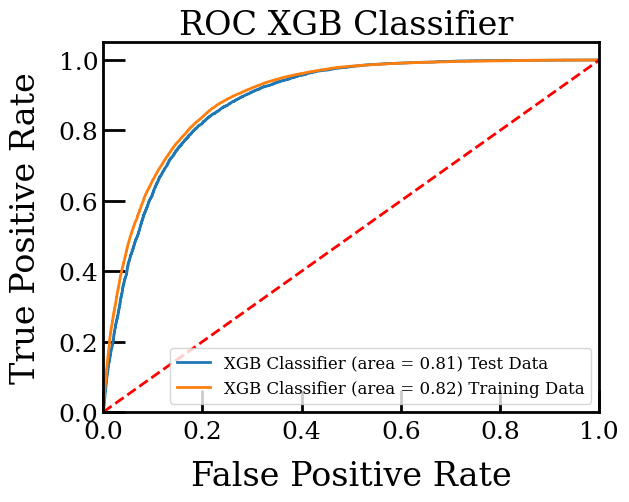

In [33]:
xgb_roc_auc = roc_auc_score(y_test, xgb.predict(X_test))
xgb_roc_auc_1 = roc_auc_score(y_train, xgb.predict(X_train))
fpr, tpr, thresholds = roc_curve(y_test, xgb.predict_proba(X_test)[:,1])
fpr_1, tpr_1, thresholds_1 = roc_curve(y_train, xgb.predict_proba(X_train)[:,1])
plt.figure()
plt.plot(fpr, tpr, label='XGB Classifier (area = %0.2f) Test Data' % xgb_roc_auc)
plt.plot(fpr_1, tpr_1, label='XGB Classifier (area = %0.2f) Training Data' % xgb_roc_auc_1)

plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC XGB Classifier ')
plt.legend(loc="lower right", )
plt.savefig('0609_Log_ROC.jpg')
plt.show()

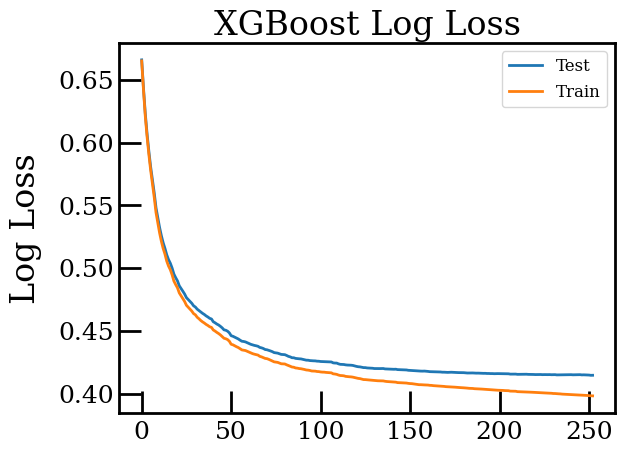

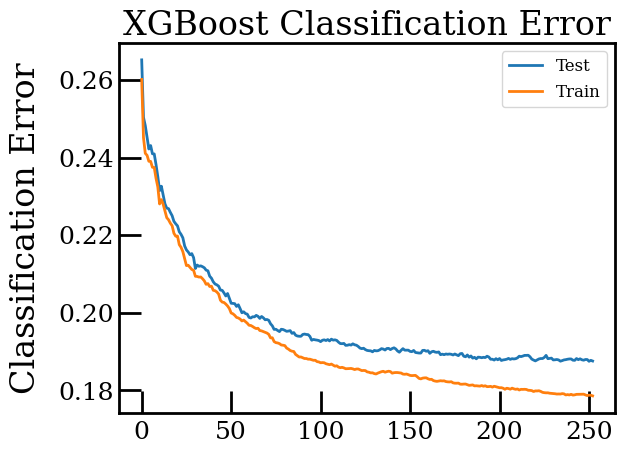

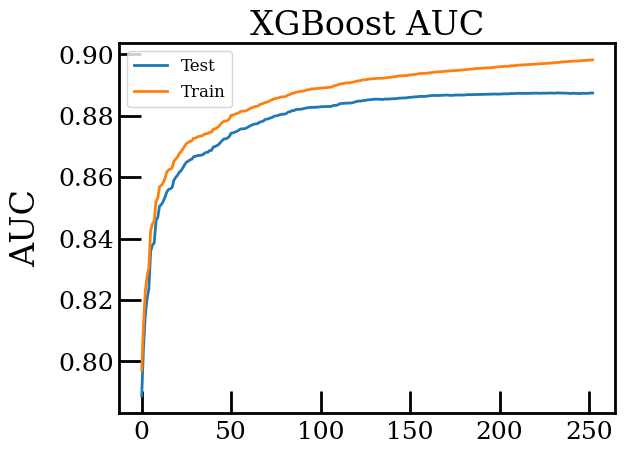

In [34]:
# retrieve performance metrics
results = xgb.evals_result()
epochs = len(results['validation_0']['error'])
x_axis = range(0, epochs)
# plot log loss
fig, ax = plt.subplots()
ax.plot(x_axis, results['validation_1']['logloss'], label='Test')
ax.plot(x_axis, results['validation_0']['logloss'], label='Train')

ax.legend()
plt.ylabel('Log Loss')
plt.title('XGBoost Log Loss')
plt.savefig('0609log_loss.jpg')
plt.show()
# plot classification error
fig, ax = plt.subplots()
ax.plot(x_axis, results['validation_1']['error'], label='Test')
ax.plot(x_axis, results['validation_0']['error'], label='Train')

ax.legend()
plt.ylabel('Classification Error')
plt.title('XGBoost Classification Error')
plt.savefig('0609error.jpg')
plt.show()

#plot auc
fig, ax = plt.subplots()
ax.plot(x_axis, results['validation_1']['auc'], label='Test')
ax.plot(x_axis, results['validation_0']['auc'], label='Train')

ax.legend()
plt.ylabel('AUC')
plt.title('XGBoost AUC')
plt.savefig('0609auc.jpg')
plt.show()

In [35]:
df_YBe_3f_x = df_YBe_3f[features]
bdt_score_YBe = xgb.predict_proba(df_YBe_3f_x)
df_Y88_3f_x = df_Y88_3f[features]
df_Y88_predict = xgb.predict(df_Y88_3f_x)
bdt_score_Y88 = xgb.predict_proba(df_Y88_3f_x)
df_sim_3f_x = df_sim_3f[features]
bdt_score_sim = xgb.predict_proba(df_sim_3f_x)
df_ac_3f_x = df_ac_3f[features]
bdt_score_ac = xgb.predict_proba(df_ac_3f_x)

In [36]:
nr_prob_ac = [subarray[1] for subarray in bdt_score_ac]
nr_prob_Y88 = [subarray[1] for subarray in bdt_score_Y88]
nr_prob_YBe = [subarray[1] for subarray in bdt_score_YBe]
nr_prob_sim = [subarray[1] for subarray in bdt_score_sim]

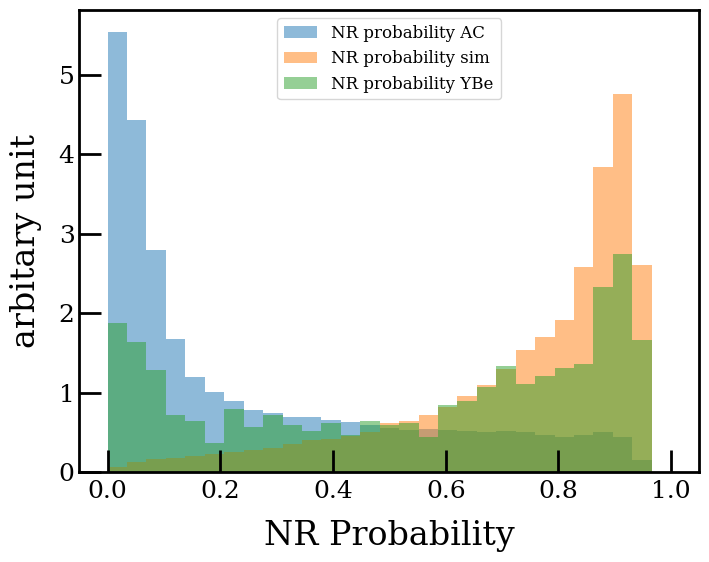

In [37]:
fig, axs = plt.subplots( figsize=(8, 6))

nbins=np.linspace(0,1,30)
plt.hist(nr_prob_ac, density = True, label='NR probability AC ', alpha = 0.5,bins=nbins)
plt.hist(nr_prob_sim, density = True, label='NR probability sim ',  alpha = 0.5,bins=nbins)
plt.hist(nr_prob_YBe, density = True,  label='NR probability YBe', alpha = 0.5,bins=nbins)
# plt.hist(nr_prob_Y88, density = True,  label='NR probability Y88',   alpha = 0.5,bins=nbins)

axs.set_xlabel('NR Probability')
axs.set_ylabel('arbitary unit')
#axs.set_title(f's1_n_competing distribution')
axs.legend(fontsize=12)
plt.savefig('0609nr_prob.jpg')

In [38]:
# ybe_ = df_YBe_3f[features]
# bdt_score_YBe = xgb.predict_proba(ybe_)

# sim_ = df_sim_3f[features]
# bdt_score_sim = xgb.predict_proba(sim_)

# ac_ = df_ac_3f[features]
# bdt_score_ac = xgb.predict_proba(ac_)

In [39]:
#rate
from datetime import datetime,timedelta, date
hour=183.78

Y88_hl=106.6
kbq_initial=698
kbq_sim=389
day_lapse=-np.log(kbq_sim/kbq_initial)/np.log(2)*Y88_hl
#2022-6-1 initial date
source_date=datetime(2022,6,1)+timedelta(days=day_lapse)
dt=(datetime(2022,10,5)-source_date)/timedelta(days=1)

gamma_ratio=0.93356 #gamma ratio between YBe and Y88 run
sim_ratio=1/(np.exp(-dt/(Y88_hl/np.log(2)))) #new scaling

s_hour=15393*sim_ratio #hours of simulation, in the same rate as YBe run
b_hour=142.21*gamma_ratio #hours of background run, in the rate, in the same rate as YBe run
y_hour=365*24
bkg_s=hour/b_hour #pre-scaling for Y88 
sim_s=hour/s_hour #pre-scaling for YBe simulation

In [40]:
# ac_hour=y_hour*normalization_3f
ac_hour=1/normalization_3f*365*24

In [48]:
# ac_hour=y_hour*normalization_3f
# df_YBe_3f = loose_filter(df_YBe)
# df_Y88_3f = loose_filter(df_Y88)
# df_ac_3f = loose_filter_ac(ac_df_3f)
# df_sim_3f = loose_filter_sim(df_sim)

sim_r=len(nr_prob_sim)/len(df_sim_3f)
ybe_r=len(nr_prob_YBe)/ len(df_YBe_3f)
ac_r = len(nr_prob_ac)/len(df_ac_3f)


ybe_hour_cor=hour*ybe_r
ybe_cor=1
ac_cor=ac_hour*ac_r/ybe_hour_cor
sim_cor=s_hour*sim_r/ybe_hour_cor



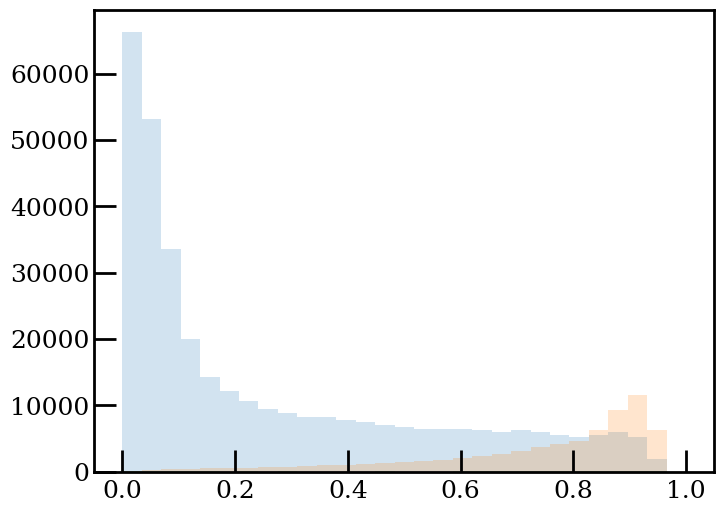

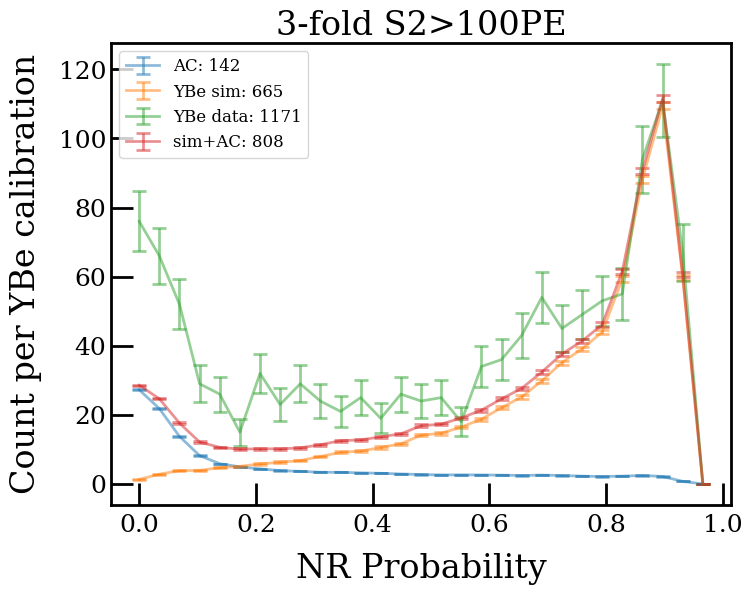

In [49]:
fig, axs = plt.subplots(figsize=(8, 6))

nbins = np.linspace(0, 1, 30)

# Scale and plot the histograms
hist_ac, _, _ = plt.hist(nr_prob_ac,  alpha=0.2, bins=nbins)
hist_sim, _, _ = plt.hist(nr_prob_sim,  alpha=0.2, bins=nbins)
hist_YBe, _, _ = plt.hist(nr_prob_YBe, alpha=0.2, bins=nbins)

fig, axs = plt.subplots(figsize=(8, 6))

# Scale the heights of the bars
scaled_hist_ac = hist_ac / ac_cor 
scaled_hist_sim = hist_sim / sim_cor
scaled_hist_YBe = hist_YBe / ybe_cor

ac_err=np.sqrt(hist_ac) / ac_cor
sim_err=np.sqrt(hist_sim) / sim_cor
ybe_err=np.sqrt(hist_YBe) / ybe_cor
all_err=np.sqrt(ac_err**2+sim_err**2)

# Plot the scaled histograms
plt.errorbar(nbins[:-1], scaled_hist_ac, ac_err, alpha=0.5, label=f'AC: {int(np.sum(scaled_hist_ac))}')
plt.errorbar(nbins[:-1], scaled_hist_sim, sim_err, alpha=0.5, label=f'YBe sim: {int(np.sum(scaled_hist_sim))}')
plt.errorbar(nbins[:-1], scaled_hist_YBe, ybe_err, alpha=0.5, label=f'YBe data: {int(np.sum(scaled_hist_YBe))}')
plt.errorbar(nbins[:-1], scaled_hist_ac+scaled_hist_sim, all_err, alpha=0.5, label=f'sim+AC: {int(np.sum(scaled_hist_ac+scaled_hist_sim))}')


axs.set_xlabel('NR Probability')
axs.set_ylabel('Count per YBe calibration')
# axs.set_yscale('log')
plt.title(f'3-fold S2>{lt}PE')
axs.legend(fontsize=12)


In [54]:
import numpy as np
from scipy.optimize import least_squares

def residual(params, a, b, c):
    r1, r2 = params
    return a * r1 + b * r2 - c

# Define initial guess for the parameters
initial_params = np.array([1.0, 1.0])

# Perform the least squares fit
result = least_squares(residual, initial_params, args=(scaled_hist_sim, scaled_hist_ac, scaled_hist_YBe))

# Extract the fitted parameters
r1_fit, r2_fit = result.x
r1_fit, r2_fit

(1.015491007173516, 3.045782178877607)

In [62]:
residuals

array([-8.38347561e+00, -3.36463560e+00,  6.14341717e+00, -5.99117229e-03,
        3.30747059e+00, -5.32808379e+00,  1.27568178e+01,  4.83061519e+00,
        1.09479994e+01,  5.55734892e+00,  1.41056418e+00,  5.50068642e+00,
       -1.14467885e+00,  5.36109988e+00,  1.32636941e+00,  2.08408227e+00,
       -6.80738056e+00,  6.97530015e+00,  5.80677709e+00,  9.89261689e+00,
        1.58713399e+01,  1.80111677e+00,  2.37827305e+00,  1.75616814e+00,
       -1.21432495e+01, -3.03528916e+00, -6.69676715e+00,  3.97605794e+00,
       -3.83533061e-02])

In [63]:
scaled_hist_YBe

array([ 76.,  66.,  52.,  29.,  26.,  15.,  32.,  23.,  29.,  24.,  21.,
        25.,  19.,  26.,  24.,  25.,  18.,  34.,  36.,  43.,  54.,  45.,
        49.,  53.,  55.,  94., 111.,  67.,   0.])

In [65]:
expected_values = scaled_hist_sim * r1_fit + scaled_hist_ac * r2_fit
residuals = scaled_hist_YBe - expected_values
chi2 = np.sum(residuals[:-1]**2/scaled_hist_YBe[:-1])
chi2/len(residuals[:-1]-2)

1.2117665094612668

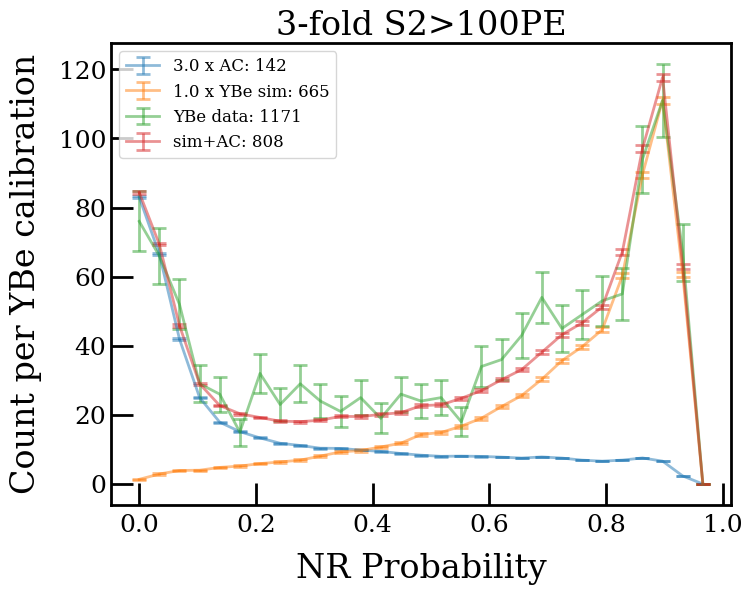

In [55]:
fig, axs = plt.subplots(figsize=(8, 6))

nbins = np.linspace(0, 1, 30)

# Plot the scaled histograms
plt.errorbar(nbins[:-1], scaled_hist_ac*r2_fit, ac_err*r2_fit, alpha=0.5, label=f'{r2_fit:.1f} x AC: {int(np.sum(scaled_hist_ac))}')
plt.errorbar(nbins[:-1], scaled_hist_sim*r1_fit, sim_err*r1_fit, alpha=0.5, label=f'{r1_fit:.1f} x YBe sim: {int(np.sum(scaled_hist_sim))}')
plt.errorbar(nbins[:-1], scaled_hist_YBe, ybe_err, alpha=0.5, label=f'YBe data: {int(np.sum(scaled_hist_YBe))}')
plt.errorbar(nbins[:-1], scaled_hist_ac*r2_fit+scaled_hist_sim*r1_fit, np.sqrt((ac_err*r2_fit)**2+(sim_err*r1_fit)**2), alpha=0.5, label=f'sim+AC: {int(np.sum(scaled_hist_ac+scaled_hist_sim))}')


axs.set_xlabel('NR Probability')
axs.set_ylabel('Count per YBe calibration')
# axs.set_yscale('log')
plt.title(f'3-fold S2>{lt}PE')
axs.legend(fontsize=12)


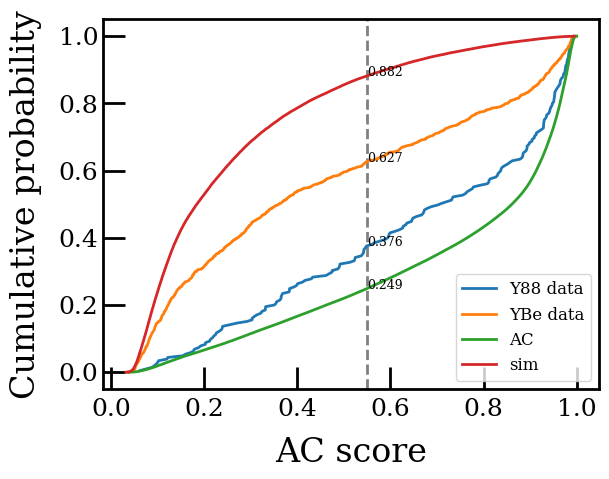

In [50]:
import statsmodels.api as sm

# Assume the dataframes ac_sim_clean and data_clean_pred have already been loaded and predicted using the XGBoost model
ac_3f_pred = xgb.predict_proba(df_ac_3f[features])[:,0]
sim_3f_pred = xgb.predict_proba(df_sim_3f[features])[:,0]
YBe_3f_pred = xgb.predict_proba(df_YBe_3f[features])[:,0]
Y88_3f_pred = xgb.predict_proba(df_Y88_3f[features])[:,0]
# Compute the ECDF of the AC scores for each dataframe
cut_value = 0.55
ecdf_Y88 = sm.distributions.ECDF(Y88_3f_pred)
ecdf_YBe = sm.distributions.ECDF(YBe_3f_pred)
ecdf_ac = sm.distributions.ECDF(ac_3f_pred)
ecdf_sim = sm.distributions.ECDF(sim_3f_pred)
plt.axvline(cut_value, color='grey', linestyle='--')

ac_threshold = ecdf_ac.y[np.argmin(np.abs(ecdf_ac.x - cut_value))]
YBe_threshold = ecdf_YBe.y[np.argmin(np.abs(ecdf_YBe.x - cut_value))]
sim_threshold = ecdf_sim.y[np.argmin(np.abs(ecdf_sim.x - cut_value))]
Y88_threshold = ecdf_Y88.y[np.argmin(np.abs(ecdf_Y88.x - cut_value))]

# Show intersection valuesAccuracy: (0.6046973205425075, 0.9355765829501238, 0.8806879254747403, 0
plt.text(cut_value, ac_threshold, f'{ac_threshold:.3f}', fontsize=9)
plt.text(cut_value, YBe_threshold, f'{YBe_threshold:.3f}', fontsize=9)
plt.text(cut_value,  sim_threshold, f'{sim_threshold:.3f}', fontsize=9)
plt.text(cut_value, Y88_threshold, f'{Y88_threshold:.3f}', fontsize=9)

# Plot the CDFs
plt.plot(ecdf_Y88.x, ecdf_Y88.y, label='Y88 data')
plt.plot(ecdf_YBe.x, ecdf_YBe.y, label='YBe data')
plt.plot(ecdf_ac.x, ecdf_ac.y, label='AC')
plt.plot(ecdf_sim.x, ecdf_sim.y, label='sim')
plt.xlabel('AC score')
plt.ylabel('Cumulative probability')
plt.legend(loc = 'lower right')
plt.savefig('0609cumulative_probabiliy.jpg')
plt.show()

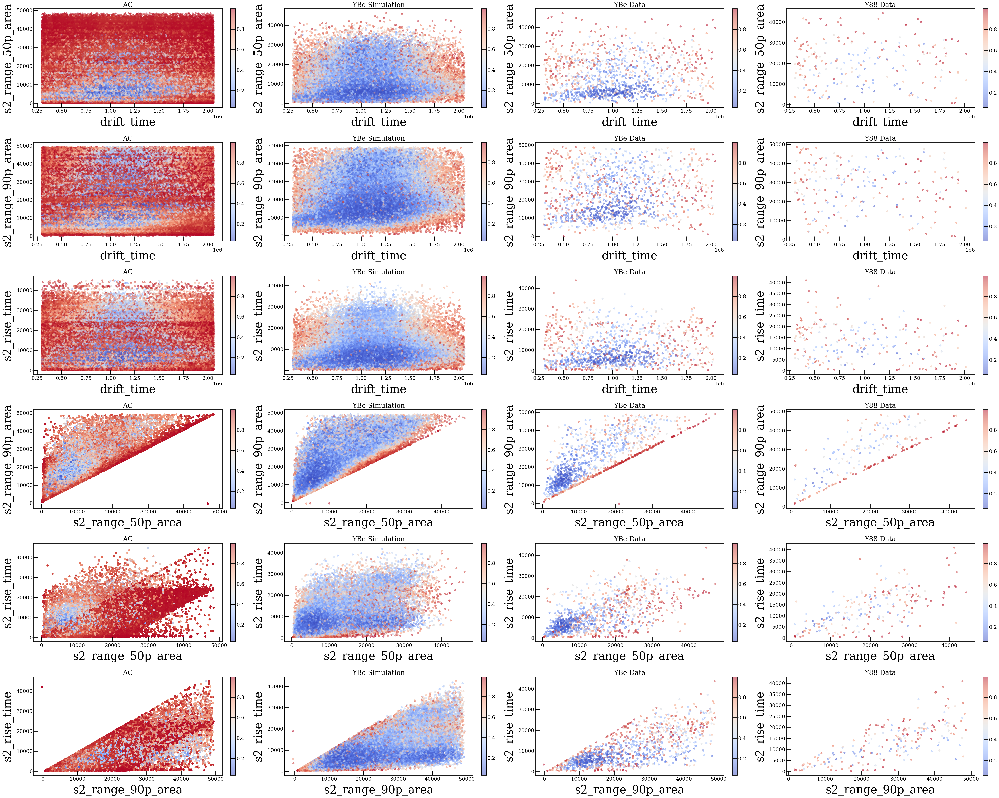

In [51]:
import itertools
feature_pairs = list(itertools.combinations(features, 2))
import pandas as pd
import matplotlib.pyplot as plt

# Plot the scatter plots with color bar
fig, axs = plt.subplots(6, 4, figsize=(50,40), sharey=False)
for i, (f1, f2) in enumerate(feature_pairs[:6]):
    for j, (df, df_pred, name) in enumerate(zip([df_ac_3f, df_sim_3f, df_YBe_3f, df_Y88_3f], [ac_3f_pred, sim_3f_pred, YBe_3f_pred, Y88_3f_pred], ['AC', 'YBe Simulation', 'YBe Data', 'Y88 Data'])):
        size=40
        
        axs[i, j].scatter(df[f1], df[f2], c=df_pred, cmap='coolwarm', s=size, alpha=0.5) #vmin=0, vmax=1)
        axs[i, j].set_xlabel(f1, fontsize = 40)
        axs[i, j].set_ylabel(f2, fontsize = 40)
        axs[i, j].set_title(f'{name}')
        fig.colorbar(axs[i, j].collections[0], ax=axs[i, j], fraction=0.046, pad=0.04)
plt.tight_layout()
plt.savefig('0609_3f_5features_features1.jpg')
plt.show()

In [52]:
xgb.save_model('YBe_XGB_3f_0522.json') ## Save model

## 2-Fold BDT Training

In [10]:
def loose_filter_2f(df):
    mask = ((df['s1_area']<=10)&(df['s1_area']>=0)&(df['s2_area']>=130)
                &(df['s2_area']<=1000)
                &(df['cut_cs2_area_fraction_top'])
                &(df['cut_s1_one_hit_per_pmt'])
                &(df['cut_cevns_search_s1_n_hits'])
                &(df['cut_s1_aft_ybe'])
                #&(df['cut_daq_veto'])
                #&(df['cut_main_is_valid_triggering_peak'])
                &(df['cut_interaction_exists'])
                #&(df['cut_run_boundaries'])
                #&(df['cut_s1_area_fraction_top'])
                #&(df['cut_s1_max_pmt'])
                #&(df['cut_s1_pattern_bottom'])
                #&(df['cut_s1_pattern_top'])
                #&(df['cut_s1_single_scatter'])
                #&(df['cut_s1_width'])
                #&(df['cut_s2_pattern'])
                &(df['cut_s2_recon_pos_diff'])
                #&(df['cut_s2_single_scatter'])
                #&(df['cut_s2_width_wire_modeled_wimps'])
                
                #&(df['cut_fiducial_volume'])
                &(df['cut_fv_ybe'])
                &(df['cut_s2_naive_bayes'])
                #&(df['cut_s1_naive_bayes'])
                #&(df['cut_bdt_ac']) # cut acceptance is very low, need to check
                &(df['cut_time_veto'])
                &(df['s1_tight_coincidence']==2)
                &(df['wire_cut'])
                &(df['cut_time_shadow'])
                &(df['cut_position_shadow'])
                &(df['cut_ambience'])
        )
    df_afc = df.loc[mask]
     
    return df_afc

In [11]:
def loose_filter_ac_2f(df):
    mask = ((df['s1_area']<=10)&(df['s1_area']>=0)&(df['s2_area']>=130)
                &(df['s2_area']<=1000)
                &(df['cut_cs2_area_fraction_top'])
                &(df['cut_s1_one_hit_per_pmt'])
                &(df['cut_cevns_search_s1_n_hits'])
                &(df['cut_s1_aft_ybe'])
                #&(df['cut_daq_veto'])
               # &(df['cut_main_is_valid_triggering_peak'])
                &(df['cut_interaction_exists'])
                #&(df['cut_run_boundaries'])
                #&(df['cut_s1_area_fraction_top'])
                #&(df['cut_s1_max_pmt'])
                #&(df['cut_s1_pattern_bottom'])
                #&(df['cut_s1_pattern_top'])
                #&(df['cut_s1_single_scatter'])
                #&(df['cut_s1_width'])
                #&(df['cut_s2_pattern'])
                &(df['cut_s2_recon_pos_diff'])
                #&(df['cut_s2_single_scatter'])
                #&(df['cut_s2_width_wire_modeled_wimps'])
                
                #&(df['cut_fiducial_volume'])
                &(df['cut_fv_ybe'])
                &(df['cut_s2_naive_bayes'])
                #&(df['cut_s1_naive_bayes'])
                #&(df['cut_bdt_ac']) # cut acceptance is very low, need to check
                #&(df['cut_time_veto'])
                &(df['s1_tight_coincidence']==2)
                &(df['cut_near_wires']==False)
                #&(df['cut_time_shadow'])
                #&(df['cut_position_shadow'])
                #&(df['cut_ambience'])
        )
    df_afc = df.loc[mask]
     
    return df_afc

In [12]:
def loose_filter_sim_2f(df):
    mask = ((df['s1_area']<=10)&(df['s1_area']>=0)&(df['s2_area']>=130)
                &(df['s2_area']<=1000)
                &(df['cut_cs2_area_fraction_top'])
                &(df['cut_s1_one_hit_per_pmt'])
                &(df['cut_cevns_search_s1_n_hits'])
                &(df['cut_s1_aft_ybe'])
                #&(df['cut_daq_veto'])
               # &(df['cut_main_is_valid_triggering_peak'])
                &(df['cut_interaction_exists'])
                #&(df['cut_run_boundaries'])
                #&(df['cut_s1_area_fraction_top'])
                #&(df['cut_s1_max_pmt'])
                #&(df['cut_s1_pattern_bottom'])
                #&(df['cut_s1_pattern_top'])
                #&(df['cut_s1_single_scatter'])
                #&(df['cut_s1_width'])
                #&(df['cut_s2_pattern'])
                &(df['cut_s2_recon_pos_diff'])
                #&(df['cut_s2_single_scatter'])
                #&(df['cut_s2_width_wire_modeled_wimps'])
                
                #&(df['cut_fiducial_volume'])
                &(df['cut_fv_ybe'])
                &(df['cut_s2_naive_bayes'])
                #&(df['cut_s1_naive_bayes'])
                #&(df['cut_bdt_ac']) # cut acceptance is very low, need to check
                #&(df['cut_time_veto'])
                &(df['s1_tight_coincidence']==2)
                &(df['cut_near_wires']==False)
                #&(df['cut_time_shadow'])
                #&(df['cut_position_shadow'])
                #&(df['cut_ambience'])
        )
    df_afc = df.loc[mask]
     
    return df_afc

In [13]:
df_YBe_2f = loose_filter_2f(df_YBe)
df_Y88_2f = loose_filter_2f(df_Y88)
df_ac_2f = loose_filter_ac_2f(ac_df_2f)
df_sim_2f = loose_filter_sim_2f(df_sim)

In [14]:
len(df_Y88_2f), len(df_YBe_2f),len(df_ac_2f), len(df_sim_2f)

(109, 673, 110925, 44095)

In [15]:
df_sim_2f.loc[:,'nr']=np.ones(len(df_sim_2f),dtype=int)
df_ac_2f.loc[:,'nr']=np.zeros(len(df_ac_2f),dtype=int)

/tmp/jobs/27933516/ipykernel_9493/4153739014.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sim_2f.loc[:,'nr']=np.ones(len(df_sim_2f),dtype=int)
/tmp/jobs/27933516/ipykernel_9493/4153739014.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_ac_2f.loc[:,'nr']=np.zeros(len(df_ac_2f),dtype=int)


In [166]:
df_ac_unique_s2 = df_ac_2f[['s2_area']].drop_duplicates()
df_ac_unique_s2_small = df_ac_unique_s2[df_ac_unique_s2['s2_area']<=upper]
len(df_ac_unique_s2), len(df_ac_unique_s2_small)

NameError: name 'df_ac_2f' is not defined

In [17]:
unique_s2_selected = df_ac_unique_s2_small.sample(int(0.8*len(df_ac_unique_s2_small)),random_state = 42)
unique_s2_train = df_ac_2f[df_ac_2f['s2_area'].isin(unique_s2_selected['s2_area'])]
unique_s2_test = df_ac_2f[(~df_ac_2f['s2_area'].isin(unique_s2_selected['s2_area']))]

In [18]:
len(df_ac_2f), len(df_sim_2f), len(unique_s2_train), len(unique_s2_test)

(110925, 44095, 72616, 38309)

In [19]:
df_sim_2f_small = df_sim_2f[df_sim_2f['s2_area']<=200]
sim_2f_train, sim_2f_test = train_test_split(df_sim_2f_small, test_size=0.2, random_state=42)
len(sim_2f_train), len(sim_2f_test)

(12174, 3044)

In [20]:
features = ['drift_time',  's2_range_50p_area','s2_rise_time', 's2_range_90p_area','s2_area']
features_nr = ['drift_time', 's2_range_50p_area','s2_rise_time', 's2_range_90p_area','s2_area','nr']

In [21]:
unique_s2_train_sample = unique_s2_train.sample(len(sim_2f_train),random_state = 42)
unique_s2_test_sample = unique_s2_test.sample(len(sim_2f_test),random_state = 42)

In [22]:
##downsampling
#df_mixed = pd.concat([unique_s2_train_sample, sim_2f_train])
#df_mixed_reduced = df_mixed[features_nr]

In [23]:
### The number of AC events is much larger than NR events, to make full use of the AC template, we are oversampling the minority samples.
from sklearn.utils import resample
sim_2f_train_upsampled = resample(sim_2f_train,
                              replace=True,  # Sample with replacement
                              n_samples=len(unique_s2_train),  # Match the number of majority class samples
                              random_state=42)

In [24]:
len(sim_2f_train_upsampled)

72616

In [25]:
df_mixed = pd.concat([unique_s2_train, sim_2f_train_upsampled])
df_mixed_reduced = df_mixed[features_nr]

In [26]:
from sklearn.utils import shuffle
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve

In [27]:
train_2f  = shuffle(df_mixed_reduced)
test_2f = pd.concat([sim_2f_test, unique_s2_test])

In [28]:
X_train = train_2f[features]
y_train = train_2f[['nr']]
X_test =  test_2f[features]
y_test =  test_2f[['nr']]

In [29]:
len(X_train), len(X_test)

(145232, 41353)

In [ ]:
from sklearn.model_selection import GridSearchCV, StratifiedKFold


# Define the parameter grid for grid search
param_grid = {
    'learning_rate': [0.01, 0.1],
    'max_depth': [3, 6],
    'gamma': [0.5, 1],
    'subsample': [0.01, 0.05],
    'colsample_bytree': [0.5, 0.75, 1],
    'reg_alpha': [0, 0.1, 0.5],
    'reg_lambda': [0, 0.1, 0.5],
    'n_estimators':[400]
}

# Define the XGBoost classifier with binary:logistic objective
eval_set = [(X_train, y_train), (X_test, y_test)]
eval_metric = ["error", "logloss","auc"]
xgb_model = xgboost.XGBClassifier(objective='binary:logistic', tree_method = 'exact')

# Use stratified K-fold cross-validation for grid search
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Perform grid search with cross-validation
grid_search = GridSearchCV(
    estimator=xgb_model, 
    param_grid=param_grid, 
    cv=cv, 
    scoring='roc_auc', 
    n_jobs=-1
)

# Fit the grid search to the data
grid_search.fit(X_train, y_train, eval_metric=eval_metric, eval_set= eval_set, early_stopping_rounds=40)

# Print the best hyperparameters and corresponding score
print("Best hyperparameters: ", grid_search.best_params_)
print("Best score: ", grid_search.best_score_)

[0]	validation_0-error:0.27149	validation_0-logloss:0.69062	validation_0-auc:0.75934	validation_1-error:0.35787	validation_1-logloss:0.69115	validation_1-auc:0.71949
[1]	validation_0-error:0.27087	validation_0-logloss:0.68813	validation_0-auc:0.76927	validation_1-error:0.38677	validation_1-logloss:0.68950	validation_1-auc:0.72638
[2]	validation_0-error:0.23436	validation_0-logloss:0.68455	validation_0-auc:0.83745	validation_1-error:0.40181	validation_1-logloss:0.68771	validation_1-auc:0.78436
[0]	validation_0-error:0.26905	validation_0-logloss:0.69056	validation_0-auc:0.76601	validation_1-error:0.30675	validation_1-logloss:0.69125	validation_1-auc:0.72274
[3]	validation_0-error:0.23612	validation_0-logloss:0.68214	validation_0-auc:0.83169	validation_1-error:0.39071	validation_1-logloss:0.68593	validation_1-auc:0.78148
[1]	validation_0-error:0.26173	validation_0-logloss:0.68782	validation_0-auc:0.78466	validation_1-error:0.36285	validation_1-logloss:0.68956	validation_1-auc:0.74004
[4]	

/home/ghusheng/.local/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ghusheng/.local/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/home/ghusheng/.local/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ghusheng/.local/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`se

[30]	validation_0-error:0.20803	validation_0-logloss:0.62002	validation_0-auc:0.86764	validation_1-error:0.42981	validation_1-logloss:0.67073	validation_1-auc:0.76107
[31]	validation_0-error:0.20796	validation_0-logloss:0.61775	validation_0-auc:0.86756	validation_1-error:0.42865	validation_1-logloss:0.66977	validation_1-auc:0.76189
[0]	validation_0-error:0.27149	validation_0-logloss:0.69063	validation_0-auc:0.75934	validation_1-error:0.35787	validation_1-logloss:0.69116	validation_1-auc:0.71949
[32]	validation_0-error:0.20889	validation_0-logloss:0.61581	validation_0-auc:0.86724	validation_1-error:0.43005	validation_1-logloss:0.66999	validation_1-auc:0.76101
[1]	validation_0-error:0.27087	validation_0-logloss:0.68814	validation_0-auc:0.76927	validation_1-error:0.38677	validation_1-logloss:0.68954	validation_1-auc:0.72639
[33]	validation_0-error:0.20894	validation_0-logloss:0.61408	validation_0-auc:0.86726	validation_1-error:0.42976	validation_1-logloss:0.66876	validation_1-auc:0.76340


/home/ghusheng/.local/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ghusheng/.local/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/home/ghusheng/.local/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ghusheng/.local/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`se

[31]	validation_0-error:0.20890	validation_0-logloss:0.61949	validation_0-auc:0.86508	validation_1-error:0.38169	validation_1-logloss:0.66408	validation_1-auc:0.77028
[32]	validation_0-error:0.20895	validation_0-logloss:0.61770	validation_0-auc:0.86495	validation_1-error:0.38875	validation_1-logloss:0.66418	validation_1-auc:0.76936
[0]	validation_0-error:0.28117	validation_0-logloss:0.69041	validation_0-auc:0.77514	validation_1-error:0.26977	validation_1-logloss:0.69104	validation_1-auc:0.74178
[33]	validation_0-error:0.20786	validation_0-logloss:0.61524	validation_0-auc:0.86580	validation_1-error:0.38940	validation_1-logloss:0.66367	validation_1-auc:0.77111
[1]	validation_0-error:0.22224	validation_0-logloss:0.68761	validation_0-auc:0.84035	validation_1-error:0.42352	validation_1-logloss:0.69179	validation_1-auc:0.71951
[34]	validation_0-error:0.20641	validation_0-logloss:0.61289	validation_0-auc:0.86656	validation_1-error:0.39480	validation_1-logloss:0.66325	validation_1-auc:0.77078


In [165]:
print("Best hyperparameters: ", grid_search.best_params_)
print("roc_auc_score: ", grid_search.best_score_)

Best hyperparameters:  {'colsample_bytree': 1, 'gamma': 1, 'learning_rate': 0.1, 'max_depth': 6, 'n_estimators': 400, 'reg_alpha': 0, 'reg_lambda': 0, 'subsample': 0.05}
roc_auc_score:  0.9186635489810241


In [30]:
xgb  = xgboost.XGBClassifier(max_depth=6,
                             colsample_bytree = 1,
                             gamma = 1,
                             subsample=0.05,
                             reg_alpha = 0,
                             reg_lambda = 0,
                             objective='binary:logistic',
                             n_estimators = 400,
                             learning_rate = 0.01,
                             tree_method = 'exact')

In [31]:
eval_set = [(X_train, y_train), (X_test, y_test)]
eval_metric = ["error", "logloss","auc"]
#eval_metric = "auc"
xgb.fit(X_train, y_train, eval_metric=eval_metric, eval_set=eval_set,early_stopping_rounds=50)

/home/ghusheng/.local/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ghusheng/.local/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[0]	validation_0-error:0.19167	validation_0-logloss:0.68865	validation_0-auc:0.85965	validation_1-error:0.40626	validation_1-logloss:0.69173	validation_1-auc:0.76326
[1]	validation_0-error:0.18550	validation_0-logloss:0.68432	validation_0-auc:0.87058	validation_1-error:0.39574	validation_1-logloss:0.68986	validation_1-auc:0.77613
[2]	validation_0-error:0.18437	validation_0-logloss:0.68006	validation_0-auc:0.87555	validation_1-error:0.37961	validation_1-logloss:0.68793	validation_1-auc:0.78223
[3]	validation_0-error:0.18393	validation_0-logloss:0.67594	validation_0-auc:0.87854	validation_1-error:0.39651	validation_1-logloss:0.68640	validation_1-auc:0.78377
[4]	validation_0-error:0.18463	validation_0-logloss:0.67174	validation_0-auc:0.88279	validation_1-error:0.39932	validation_1-logloss:0.68517	validation_1-auc:0.77330
[5]	validation_0-error:0.18473	validation_0-logloss:0.66760	validation_0-auc:0.88424	validation_1-error:0.40302	validation_1-logloss:0.68439	validation_1-auc:0.77516
[6]	

XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, gamma=1, gpu_id=-1, grow_policy='depthwise',
              importance_type=None, interaction_constraints='',
              learning_rate=0.01, max_bin=256, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=6, max_leaves=0, min_child_weight=1,
              missing=nan, monotone_constraints='()', n_estimators=400,
              n_jobs=0, num_parallel_tree=1, predictor='auto', random_state=0,
              reg_alpha=0, reg_lambda=0, ...)

In [32]:
y_pred= xgb.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy}")

Accuracy: 0.6129180470582546


In [33]:
y_pred_ac = xgb.predict( unique_s2_test[features])

In [34]:
ac_accuracy = accuracy_score(unique_s2_test[['nr']], y_pred_ac)
print(f"Accuracy: {ac_accuracy}")

Accuracy: 0.5951865096974601


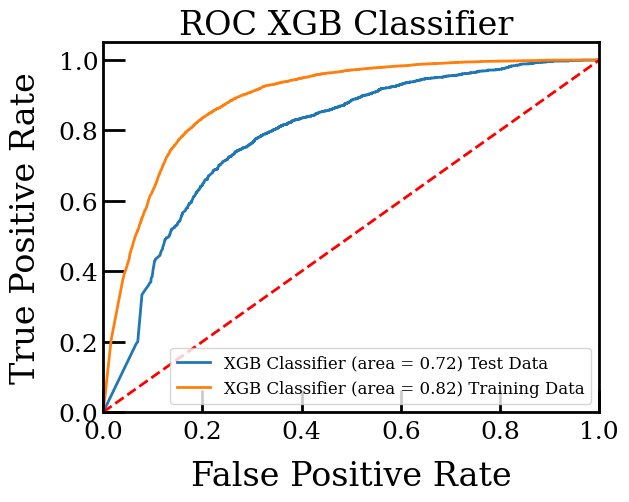

In [35]:
xgb_roc_auc = roc_auc_score(y_test, xgb.predict(X_test))
xgb_roc_auc_1 = roc_auc_score(y_train, xgb.predict(X_train))
fpr, tpr, thresholds = roc_curve(y_test, xgb.predict_proba(X_test)[:,1])
fpr_1, tpr_1, thresholds_1 = roc_curve(y_train, xgb.predict_proba(X_train)[:,1])
plt.figure()
plt.plot(fpr, tpr, label='XGB Classifier (area = %0.2f) Test Data' % xgb_roc_auc)
plt.plot(fpr_1, tpr_1, label='XGB Classifier (area = %0.2f) Training Data' % xgb_roc_auc_1)

plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC XGB Classifier ')
plt.legend(loc="lower right", )
plt.savefig('0609_Log_ROC_2f.jpg')
plt.show()

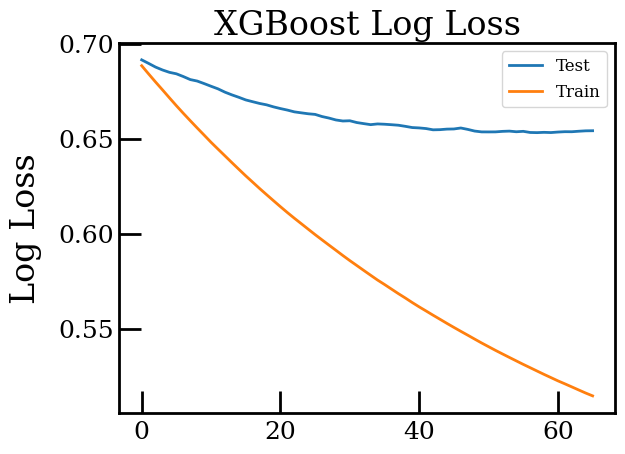

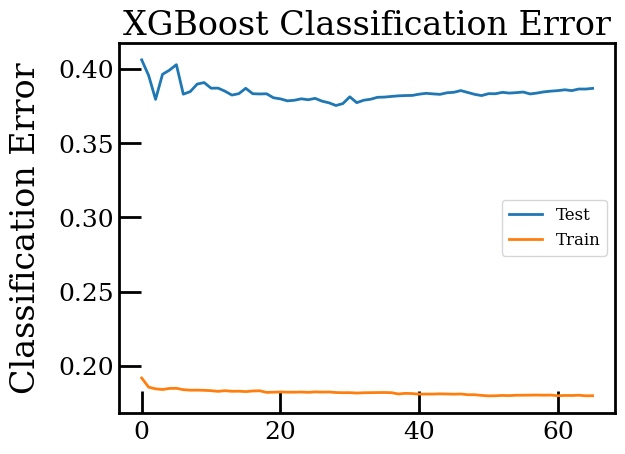

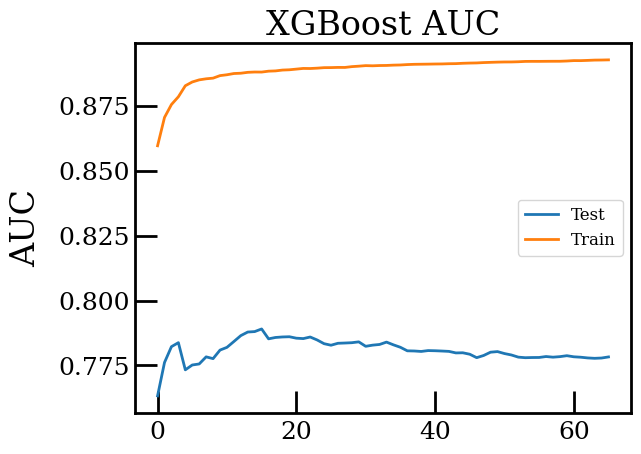

In [36]:
# retrieve performance metrics
results = xgb.evals_result()
epochs = len(results['validation_0']['error'])
x_axis = range(0, epochs)
# plot log loss
fig, ax = plt.subplots()
ax.plot(x_axis, results['validation_1']['logloss'], label='Test')
ax.plot(x_axis, results['validation_0']['logloss'], label='Train')

ax.legend()
plt.ylabel('Log Loss')
plt.title('XGBoost Log Loss')
plt.savefig('0609log_loss_2f.jpg')
plt.show()
# plot classification error
fig, ax = plt.subplots()
ax.plot(x_axis, results['validation_1']['error'], label='Test')
ax.plot(x_axis, results['validation_0']['error'], label='Train')

ax.legend()
plt.ylabel('Classification Error')
plt.title('XGBoost Classification Error')
plt.savefig('0609error_2f.jpg')
plt.show()

#plot auc
fig, ax = plt.subplots()
ax.plot(x_axis, results['validation_1']['auc'], label='Test')
ax.plot(x_axis, results['validation_0']['auc'], label='Train')

ax.legend()
plt.ylabel('AUC')
plt.title('XGBoost AUC')
plt.savefig('0609auc_2f.jpg')
plt.show()

In [37]:
## Check the training performance at low energy region 's2_area' < 200PE
df_YBe_2f_small = df_YBe_2f[df_YBe_2f['s2_area'] < 200]
df_Y88_2f_small = df_Y88_2f[df_Y88_2f['s2_area'] < 200]
df_ac_2f_small = df_ac_2f[df_ac_2f['s2_area'] < 200]
df_sim_2f_small = df_sim_2f[df_sim_2f['s2_area'] < 200]

In [38]:
df_YBe_2f_x = df_YBe_2f_small[features]
bdt_score_YBe = xgb.predict_proba(df_YBe_2f_x)
df_Y88_2f_x = df_Y88_2f_small[features]
df_Y88_predict = xgb.predict(df_Y88_2f_x)
bdt_score_Y88 = xgb.predict_proba(df_Y88_2f_x)
df_sim_2f_x = df_sim_2f_small[features]
bdt_score_sim = xgb.predict_proba(df_sim_2f_x)
df_ac_2f_x = df_ac_2f_small[features]
bdt_score_ac = xgb.predict_proba(df_ac_2f_x)

In [39]:
nr_prob_ac = [subarray[1] for subarray in bdt_score_ac]
nr_prob_Y88 = [subarray[1] for subarray in bdt_score_Y88]
nr_prob_YBe = [subarray[1] for subarray in bdt_score_YBe]
nr_prob_sim = [subarray[1] for subarray in bdt_score_sim]

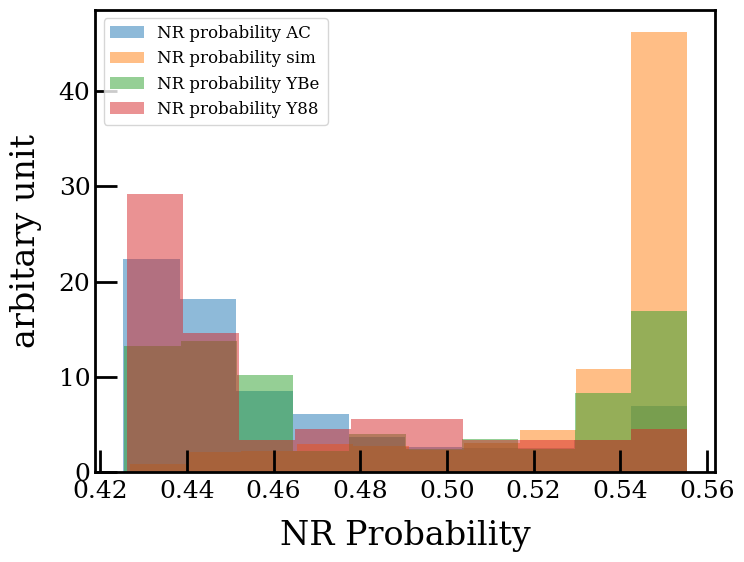

In [40]:
fig, axs = plt.subplots( figsize=(8, 6))


plt.hist(nr_prob_ac, density = True, label='NR probability AC ', alpha = 0.5)
plt.hist(nr_prob_sim, density = True, label='NR probability sim ',  alpha = 0.5)
plt.hist(nr_prob_YBe, density = True,  label='NR probability YBe', alpha = 0.5)
plt.hist(nr_prob_Y88, density = True,  label='NR probability Y88',   alpha = 0.5)

axs.set_xlabel('NR Probability')
axs.set_ylabel('arbitary unit')
#axs.set_title(f's1_n_competing distribution')
axs.legend(fontsize=12)
plt.savefig('0609nr_prob_2f.jpg')

In [ ]:
import statsmodels.api as sm

# Assume the dataframes ac_sim_clean and data_clean_pred have already been loaded and predicted using the XGBoost model
ac_2f_pred = xgb.predict_proba(df_ac_2f_small[features])[:,0]
sim_2f_pred = xgb.predict_proba(df_sim_2f_small[features])[:,0]
YBe_2f_pred = xgb.predict_proba(df_YBe_2f_small[features])[:,0]
Y88_2f_pred = xgb.predict_proba(df_Y88_2f_small[features])[:,0]
# Compute the ECDF of the AC scores for each dataframe
cut_value = 0.57
ecdf_Y88 = sm.distributions.ECDF(Y88_2f_pred)
ecdf_YBe = sm.distributions.ECDF(YBe_2f_pred)
ecdf_ac = sm.distributions.ECDF(ac_2f_pred)
ecdf_sim = sm.distributions.ECDF(sim_2f_pred)
plt.axvline(cut_value, color='grey', linestyle='--')

ac_threshold = ecdf_ac.y[np.argmin(np.abs(ecdf_ac.x - cut_value))]
YBe_threshold = ecdf_YBe.y[np.argmin(np.abs(ecdf_YBe.x - cut_value))]
sim_threshold = ecdf_sim.y[np.argmin(np.abs(ecdf_sim.x - cut_value))]
Y88_threshold = ecdf_Y88.y[np.argmin(np.abs(ecdf_Y88.x - cut_value))]

# Show intersection valuesAccuracy: (0.6046973205425075, 0.9355765829501238, 0.8806879254747403, 0
plt.text(cut_value, ac_threshold, f'{ac_threshold:.3f}', fontsize=9)
plt.text(cut_value, YBe_threshold, f'{YBe_threshold:.3f}', fontsize=9)
plt.text(cut_value,  sim_threshold, f'{sim_threshold:.3f}', fontsize=9)
plt.text(cut_value, Y88_threshold, f'{Y88_threshold:.3f}', fontsize=9)

# Plot the CDFs
plt.plot(ecdf_Y88.x, ecdf_Y88.y, label='Y88 data')
plt.plot(ecdf_YBe.x, ecdf_YBe.y, label='YBe data')
plt.plot(ecdf_ac.x, ecdf_ac.y, label='AC')
plt.plot(ecdf_sim.x, ecdf_sim.y, label='sim')
plt.xlabel('AC score')
plt.ylabel('Cumulative probability')
plt.legend(loc = 'lower right')
plt.savefig('0609cumulative_probabiliy_2f.jpg')
plt.show()

NameError: name 'df_ac_2f_small' is not defined

NameError: name 'df_ac_2f_small' is not defined

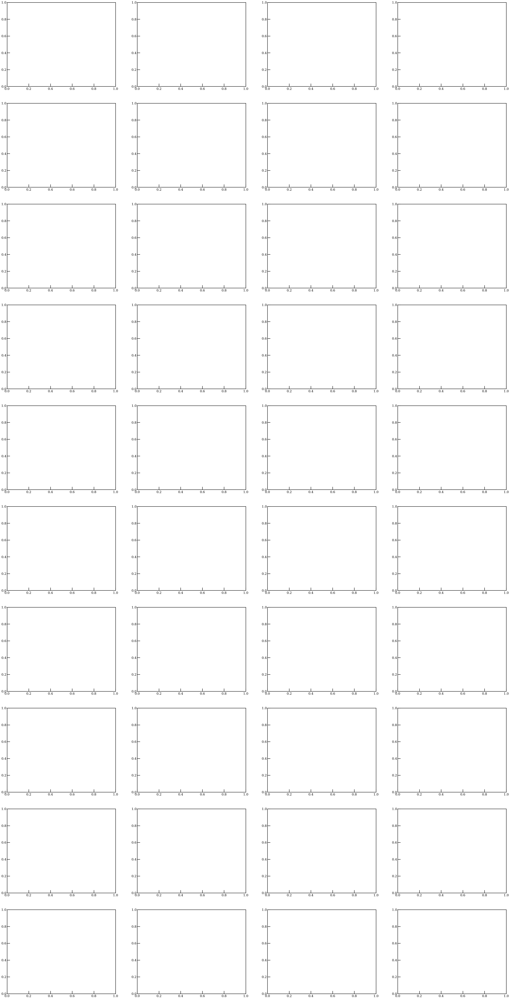

In [ ]:
import itertools
feature_pairs = list(itertools.combinations(features, 2))
import pandas as pd
import matplotlib.pyplot as plt

# Plot the scatter plots with color bar
fig, axs = plt.subplots(10, 4, figsize=(50,100), sharey=False)
for i, (f1, f2) in enumerate(feature_pairs):
    for j, (df, df_pred, name) in enumerate(zip([df_ac_2f_small, df_sim_2f_small, df_YBe_2f_small, df_Y88_2f_small], [ac_2f_pred, sim_2f_pred, YBe_2f_pred, Y88_2f_pred], ['AC', 'YBe Simulation', 'YBe Data', 'Y88 Data'])):
        size=40
        
        axs[i, j].scatter(df[f1], df[f2], c=df_pred, cmap='coolwarm', s=size, alpha=0.5) #vmin=0, vmax=1)
        axs[i, j].set_xlabel(f1, fontsize = 40)
        axs[i, j].set_ylabel(f2, fontsize = 40)
        axs[i, j].set_title(f'{name}')
        fig.colorbar(axs[i, j].collections[0], ax=axs[i, j], fraction=0.046, pad=0.04)
plt.tight_layout()
plt.savefig('0609_2f_5features_features_2f.jpg')
plt.show()

In [418]:
xgb.save_model('YBe_XGB_2f_0522.json') ## Save model